In [170]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from mapsplotlib import mapsplot as mplt
import folium
from gmplot import gmplot
import branca
import seaborn as sns
# import plotly.plotly as py
# import plotly.graph_objs as go

%matplotlib inline
import mpld3
mpld3.enable_notebook()

# load data

In [2]:
sales_granular = pd.read_csv('data/sales_granular.csv')

surrounding = pd.read_json('data/Surroundings.json')

In [3]:
print("sales_granular.csv")
print("Number of shops", len(sales_granular))
assert sales_granular.columns[0] == 'store_code'
dates = sales_granular.columns[1:]
print("Data from", dates[0], "to", dates[-1])
print()

print("surrounding.json")
print(surrounding.keys())
print("Number of shops", len(surrounding))

sales_granular.csv
Number of shops 906
Data from 8/3/15 9:00 to 6/25/17 22:00

surrounding.json
Index(['store_code', 'surroundings'], dtype='object')
Number of shops 546


In [4]:
# merge to focus only on the stores where we have both sales and info on surroundings
store = pd.merge(sales_granular, surrounding, how='inner', on='store_code')
len(store)

546

# lets define our target variable

In [5]:
# performance will be define as the total of sales
# calculate total for each POS
# on all data, per day of week, monthly, annualy
# having the target not only on the all period can help to detect different features
# notes: day of year too sparse, day of month too

index_time = store[dates].T  # transpose to have timestamp on index -> easier
dt = pd.to_datetime(index_time.index)

total = index_time.sum()
total_dayofweek = index_time.groupby(dt.dayofweek).sum()
total_month = index_time.groupby(dt.month).sum()
total_year = index_time.groupby(dt.year).sum()
total_hour = index_time.groupby(dt.hour).sum()

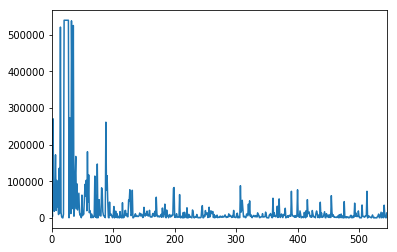

In [6]:
total.plot()

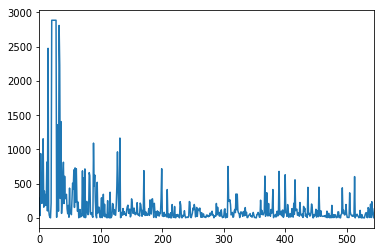

In [7]:
index_time.count().plot()

the correlation between total of sells and number of day worked is pretty high

ideally the position of a POS should be decided by the interest of the area

0     44
1     40
2     46
3     35
4     30
5     48
6    281
dtype: int64


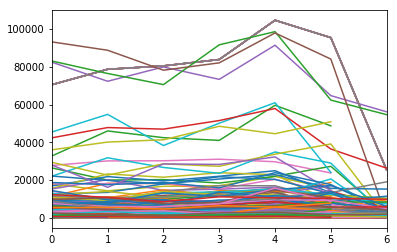

In [19]:
print(total_dayofweek.T.isnull().sum())
total_dayofweek.plot(legend=False)

1      93
2      62
3      59
4      54
5      52
6      45
7     453
8     443
9     438
10    437
11    248
12    138
dtype: int64


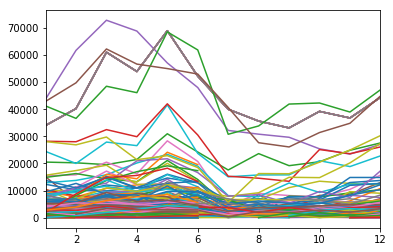

In [9]:
print(total_month.T.isnull().sum())
total_month.plot(legend=False)

2015    538
2016    123
2017      0
dtype: int64


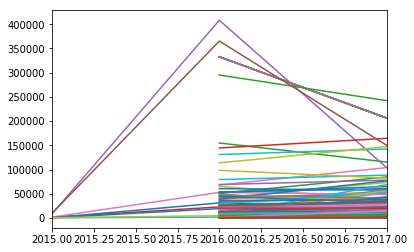

In [24]:
print(total_year.T.isnull().sum())
total_year.plot(legend=False)

0     546
1     546
2     546
3     546
4     546
5     497
6     334
7     210
8     121
9      93
10     81
11     80
12     76
13     77
14     73
15     67
16     59
17     64
18    116
19    339
20    442
21    481
22    521
23    532
dtype: int64


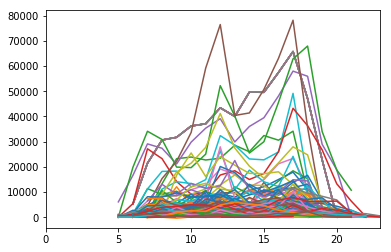

In [11]:
print(total_hour.T.isnull().sum())
total_hour.plot(legend=False)

the thing is that it seems that some place opened after others as some years have no income

some are also more likely to be close during summer vacation or sundays

to not have this biasing our result we can normalise per the days were something have been written

aka no nan

we will see later how that affect our analysis

the thing is that maybe some area cannot work on sundays but others can? that can modify the analysis

but i dont know enough about suisse custom and law to go further on this



In [12]:
total_norm = total / index_time.count()
total_dayofweek_norm = total_dayofweek / index_time.groupby(dt.dayofweek).count()
total_month_norm = total_month / index_time.groupby(dt.month).count()
total_year_norm = total_year / index_time.groupby(dt.year).count()
total_hour_norm = total_hour / index_time.groupby(dt.hour).count()

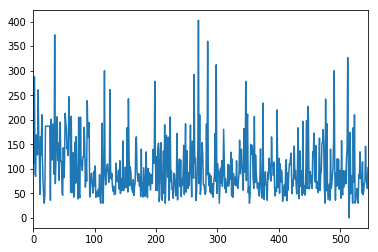

In [13]:
total_norm.plot()

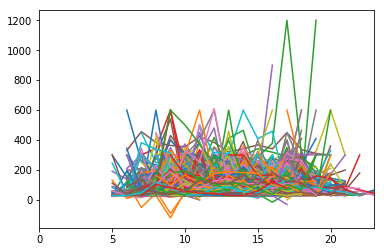

In [14]:
total_hour_norm.plot(legend=False)

this look more balanced, hence the number of days doesnt matter

we can focus now on area related features

note: we need to keep in mind that this consider that the number of days worked doesnt matter

In [15]:
target_dict = {'total': total.T,
               'total_dayofweek': total_dayofweek.T,
               'total_month': total_month.T,
               'total_year': total_year.T,
               'total_norm': total_norm.T,
               'total_dayofweek_norm': total_dayofweek_norm.T,
               'total_month_norm': total_month_norm.T,
               'total_year_norm': total_year_norm.T}

In [16]:
targets = pd.concat(target_dict, 1)
targets.head()
len(targets)

546

# lets dig inside the data about the surrounding

In [25]:
surrounding.head()

,store_code,surroundings
0,10055,"{'subway_station': [], 'department_store': [],..."
1,10077,"{'subway_station': [], 'department_store': [],..."
2,10079,"{'subway_station': [], 'department_store': [{'..."
3,10086,"{'subway_station': [], 'department_store': [],..."
4,10111,"{'subway_station': [], 'department_store': [],..."


In [26]:
# lets check a bit more what is in the surroundings column
surr = store.surroundings.apply(pd.Series)
surr.head()

,accounting,airport,amusement_park,aquarium,art_gallery,atm,bakery,bank,bar,beauty_salon,...,store,subway_station,synagogue,taxi_stand,train_station,transit_station,travel_agency,university,veterinary_care,zoo
0,[{'name': 'Fiduciaire Exacte & Gestion Comptab...,[],[],[],"[{'website': 'http://www.onegeeinfog.com/', 'n...","[{'website': 'https://www.ubs.com/ch/fr.html',...","[{'name': 'Mconseils SA', 'place_id': 'ChIJRz1...","[{'website': 'http://www.ubs.ch/', 'rating': 5...","[{'rating': 3.5, 'place_id': 'ChIJ8xHdm_1vjEcR...","[{'website': 'http://www.jadebeaute.com/', 'ra...",...,[{'website': 'https://filialen.migros.ch/de/mi...,[],[],[],[],"[{'name': 'Chêne-Bourg, La Mousse', 'place_id'...","[{'name': 'Courir au Népal Sàrl', 'place_id': ...",[],[{'website': 'http://www.vet-chene-bougeries.c...,[]
1,[],[],[],[],[],[],"[{'rating': 4.8, 'place_id': 'ChIJM8FbQe9vjEcR...",[],[],[],...,[{'website': 'http://www.coop.ch/fr/services/a...,[],[],[],[],"[{'name': 'Chêne-Bougeries, Montagne', 'place_...",[],[],[],[]
2,[{'website': 'http://www.vd.ch/autorites/depar...,[],[],[],[],"[{'name': 'PickPost-Stelle', 'opening_hours': ...",[{'website': 'https://filialen.migros.ch/de/ta...,"[{'website': 'https://www.ubs.com/ch/fr.html',...",[{'website': 'https://www.facebook.com/Highlan...,"[{'rating': 5, 'place_id': 'ChIJmxg6U4LPjUcR86...",...,"[{'website': 'http://www.denner.ch/', 'rating'...",[],[],[],[],"[{'name': 'Yverdon-les-Bains, Bel-Air', 'place...","[{'website': 'http://www.hotelplan.ch/FR/', 'r...",[],[],[]
3,[],[],[],[],[],[],[],[],"[{'website': 'http://www.oubangui.com/', 'rati...",[{'website': 'http://www.blattnerpodologue.ch/...,...,"[{'rating': 3.3, 'place_id': 'ChIJUW-HLeAxjEcR...",[],[],[],[],"[{'name': 'Bois-Gentil', 'place_id': 'ChIJK8fw...",[],[],[],[]
4,[],[],[],[],[],[],[],[],[],[],...,"[{'name': 'lookemontre.com', 'opening_hours': ...",[],[],[],[],"[{'name': 'Yverdon-les-Bains, Plaisance', 'pla...",[],[],[],[]


a very nested structure apparently

we need to know what we can get

### lets first count how many of each time are present for each shops

In [27]:
number_ameneties = surr.applymap(len)
number_ameneties.head()

,accounting,airport,amusement_park,aquarium,art_gallery,atm,bakery,bank,bar,beauty_salon,...,store,subway_station,synagogue,taxi_stand,train_station,transit_station,travel_agency,university,veterinary_care,zoo
0,3,0,0,0,1,1,3,3,1,4,...,31,0,0,0,0,2,1,0,1,0
1,0,0,0,0,0,0,1,0,0,0,...,6,0,0,0,0,1,0,0,0,0
2,1,0,0,0,0,3,3,1,4,4,...,53,0,0,0,0,4,2,0,0,0
3,0,0,0,0,0,0,0,0,1,2,...,3,0,0,0,0,1,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,2,0,0,0,0,4,0,0,0,0


### now lets see what we have for each

In [28]:
surr_sets = surr.applymap(lambda x: [set(y.keys()) for y in x] if x else None)
surr_sets_inter = surr_sets.applymap(lambda x: set.intersection(*x) if x else set())
surr_sets_inter.head()

,accounting,airport,amusement_park,aquarium,art_gallery,atm,bakery,bank,bar,beauty_salon,...,store,subway_station,synagogue,taxi_stand,train_station,transit_station,travel_agency,university,veterinary_care,zoo
0,"{formatted_address, types, place_id, latitude,...",{},{},{},"{formatted_address, types, place_id, website, ...","{formatted_address, reviews, rating, user_rati...","{formatted_address, types, place_id, latitude,...","{formatted_address, reviews, rating, user_rati...","{formatted_address, reviews, rating, user_rati...","{formatted_address, types, place_id, latitude,...",...,"{formatted_address, types, place_id, latitude,...",{},{},{},{},"{formatted_address, types, place_id, address_c...","{formatted_address, types, place_id, latitude,...",{},"{formatted_address, reviews, rating, user_rati...",{}
1,{},{},{},{},{},{},"{formatted_address, reviews, rating, user_rati...",{},{},{},...,"{formatted_address, types, place_id, latitude,...",{},{},{},{},"{formatted_address, types, place_id, latitude,...",{},{},{},{}
2,"{formatted_address, types, place_id, website, ...",{},{},{},{},"{formatted_address, types, place_id, latitude,...","{formatted_address, types, place_id, opening_h...","{formatted_address, reviews, rating, user_rati...","{formatted_address, reviews, rating, user_rati...","{formatted_address, types, place_id, address_c...",...,"{formatted_address, types, place_id, latitude,...",{},{},{},{},"{formatted_address, types, place_id, address_c...","{formatted_address, types, place_id, website, ...",{},{},{}
3,{},{},{},{},{},{},{},{},"{formatted_address, reviews, rating, user_rati...","{formatted_address, reviews, rating, user_rati...",...,"{formatted_address, reviews, rating, user_rati...",{},{},{},{},"{formatted_address, types, place_id, latitude,...",{},{},{},{}
4,{},{},{},{},{},{},{},{},{},{},...,"{formatted_address, types, place_id, opening_h...",{},{},{},{},"{formatted_address, types, place_id, address_c...",{},{},{},{}


In [29]:
t = surr_sets_inter.apply(lambda x: set.union(*x))
t.head()

accounting        {reviews, types, user_ratings_total, website, ...
airport           {reviews, types, user_ratings_total, website, ...
amusement_park    {reviews, types, user_ratings_total, website, ...
aquarium          {formatted_address, reviews, types, user_ratin...
art_gallery       {reviews, types, user_ratings_total, website, ...
dtype: object

In [30]:
inter = set.intersection(*[o for o in t if o])
union = set.union(*[o for o in t if o])
print(sorted(inter), len(inter))
print(sorted(union), len(union))
print(sorted(union-inter), len(union-inter))

['address_components', 'formatted_address', 'icon', 'latitude', 'longitude', 'name', 'place_id', 'reviews', 'types', 'user_ratings_total'] 10
['address_components', 'formatted_address', 'icon', 'international_phone_number', 'latitude', 'longitude', 'name', 'opening_hours', 'place_id', 'price_level', 'rating', 'reviews', 'types', 'user_ratings_total', 'website'] 15
['international_phone_number', 'opening_hours', 'price_level', 'rating', 'website'] 5


all place have 

'address_components', 'formatted_address', 'icon', 'latitude', 'longitude', 'name', 'place_id', 'reviews', 'types', 'user_ratings_total'

some have

'international_phone_number', 'opening_hours', 'price_level', 'rating', 'website'

What would be useful?

phone number and website are unlikely to help

lets watch for one ->

In [31]:
elemt = surr.accounting[0][0]
keys = sorted(elemt.keys())
# print(elemt)
for k in keys:
    print(k)
    print("->", elemt[k])

address_components
-> [{'long_name': '6', 'types': ['street_number'], 'short_name': '6'}, {'long_name': 'Rue de Genève', 'types': ['route'], 'short_name': 'Rue de Genève'}, {'long_name': 'Chêne-Bourg', 'types': ['locality', 'political'], 'short_name': 'Chêne-Bourg'}, {'long_name': 'Genève', 'types': ['administrative_area_level_2', 'political'], 'short_name': 'Genève'}, {'long_name': 'Genève', 'types': ['administrative_area_level_1', 'political'], 'short_name': 'GE'}, {'long_name': 'Switzerland', 'types': ['country', 'political'], 'short_name': 'CH'}, {'long_name': '1225', 'types': ['postal_code'], 'short_name': '1225'}]
formatted_address
-> Rue de Genève 6, 1225 Chêne-Bourg, Switzerland
icon
-> https://maps.gstatic.com/mapfiles/place_api/icons/generic_business-71.png
international_phone_number
-> +41 22 348 55 28
latitude
-> 46.195035
longitude
-> 6.192834800000001
name
-> Fiduciaire Exacte & Gestion Comptable Isotton Turel Sàrl
opening_hours
-> {'weekday_text': ['Monday: 9:00 AM – 5:0

In [32]:
amusement_park = surr.amusement_park
elemt = amusement_park[14][0]
keys = sorted(elemt.keys())
# print(elemt)
for k in keys:
    print(k)
    print("->", elemt[k])

address_components
-> [{'long_name': '14', 'types': ['street_number'], 'short_name': '14'}, {'long_name': 'Rue Edmond de Reynier', 'types': ['route'], 'short_name': 'Rue Edmond de Reynier'}, {'long_name': 'Neuchâtel', 'types': ['locality', 'political'], 'short_name': 'Neuchâtel'}, {'long_name': 'Neuchâtel', 'types': ['administrative_area_level_2', 'political'], 'short_name': 'Neuchâtel'}, {'long_name': 'Neuchâtel', 'types': ['administrative_area_level_1', 'political'], 'short_name': 'NE'}, {'long_name': 'Switzerland', 'types': ['country', 'political'], 'short_name': 'CH'}, {'long_name': '2000', 'types': ['postal_code'], 'short_name': '2000'}]
formatted_address
-> Rue Edmond de Reynier 14, 2000 Neuchâtel, Switzerland
icon
-> https://maps.gstatic.com/mapfiles/place_api/icons/generic_business-71.png
latitude
-> 46.9964652
longitude
-> 6.938777200000001
name
-> Place de jeux Edmond-de-Reynier
place_id
-> ChIJL1kuexgKjkcRAZdGMRXVDU8
rating
-> 3
reviews
-> [{'rating': 3, 'author_name': 'Stép

we dont have info about the shop position but we have of its surrounding

by taking the mean of all the shop we can guess the position of the shop

lets take latitude and longitude

---

adresses are a bit difficult, but having the city could be interesting

---

icon, name, phone number are not interesting

---

opening_hours could be very usefull to correlate with per hour sells

--- 

place_id not interesting

---

types could be interesting to make a bag of words like features

### lets extract some of those features

In [33]:
def get_feature(row, feature=None):
    lat = []
#     lon = []
#     print(len(x))
    if len(row)>0:
        for x in row:
            if len(x) > 0:
                for elemt in x:
        #             print(elemt.keys())
                    if feature in elemt.keys():
                        lat.append(elemt[feature])
    #                 lon.append(elemt['longitude'])
        if len(lat) == 0:
            return []
    return lat

def make_get_feature(feature):
    return lambda row: get_feature(row, feature)


In [34]:
extract_rating_total = surr.apply(make_get_feature('user_ratings_total'), 1)
extract_reviews = surr.apply(make_get_feature('reviews'), 1)

extract_name = surr.apply(make_get_feature('name'), 1)
extract_types = surr.apply(make_get_feature('types'), 1)
# extract_name = surr.dropna()

extract_lat = surr.apply(make_get_feature('latitude'), 1)
# extract_lat = extract_lat.dropna()

extract_lon = surr.apply(make_get_feature('longitude'), 1)
# extract_lon = extract_lon.dropna()

assert len(extract_lat) == len(extract_lon)
# extract_name = extract_name.iloc[extract_lat.index]
assert len(extract_lat) == len(extract_lon) == len(extract_name) == len(extract_reviews)

### locations

In [35]:
mean_lat = extract_lat.apply(lambda x: np.mean(x) if x else None)
mean_lon = extract_lon.apply(lambda x: np.mean(x) if x else None)
min_lat = extract_lat.apply(lambda x: min(x) if x else None)
max_lat = extract_lat.apply(lambda x: max(x) if x else None)
min_lon = extract_lon.apply(lambda x: min(x) if x else None)
max_lon = extract_lon.apply(lambda x: max(x) if x else None)
dlat = max_lat - min_lat
dlon = max_lon - min_lon

In [36]:
def haversine_np(lon1, lat1, dlon, dlat):
    """
    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees)

    All args must be of equal length.    

    """
    lon1, lat1, dlon, dlat = map(np.radians, [lon1, lat1, dlon, dlat])

    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat1+dlat) * np.sin(dlon/2.0)**2

    c = 2 * np.arcsin(np.sqrt(a))
    km = 6371 * c
    return km

In [37]:
m = folium.Map(
    location=[np.mean(mean_lat), np.mean(mean_lon)],
    zoom_start=8
)

for la, lo, dla, dlo in zip(mean_lat, mean_lon, dlat, dlon):
    if not np.isnan(la):
        d = haversine_np(lo, la, dlo, dla)
#         print(d)
        folium.features.Circle(
            radius=d*700, # 700 instead of 1000, seems to be enough for the aprox i made
            location=[la, lo],
    #         popup='The Waterfront',
            color='crimson',
            fill=False,
        ).add_to(m)

# just plot the shops for some
for i in  range(3):
    for la, lo, te in zip(extract_lat.iloc[i], extract_lon.iloc[i], extract_name.iloc[i]):
        folium.features.Circle(location=[la, lo], radius=1, color='blue',
            fill=False,).add_to(m)

m

I couldnt manage to find a library to show all shops while keeping it embeded in the notebook thus the idea to just find the mean position

We can see that the shops are present a little bit everywhere

this makes think that having a map with the density in suisse would be very helpful

## types

In [38]:
extract_types.iloc[0]

[['accounting', 'finance', 'point_of_interest', 'establishment'],
 ['accounting', 'finance', 'point_of_interest', 'establishment'],
 ['accounting', 'finance', 'point_of_interest', 'establishment'],
 ['art_gallery', 'point_of_interest', 'establishment'],
 ['bank', 'atm', 'finance', 'point_of_interest', 'establishment'],
 ['bakery', 'food', 'store', 'point_of_interest', 'establishment'],
 ['bakery', 'cafe', 'food', 'store', 'point_of_interest', 'establishment'],
 ['bakery', 'cafe', 'food', 'store', 'point_of_interest', 'establishment'],
 ['bank', 'finance', 'point_of_interest', 'establishment'],
 ['bank', 'atm', 'finance', 'point_of_interest', 'establishment'],
 ['bank', 'finance', 'point_of_interest', 'establishment'],
 ['restaurant', 'bar', 'food', 'point_of_interest', 'establishment'],
 ['beauty_salon', 'point_of_interest', 'establishment'],
 ['hair_care', 'beauty_salon', 'point_of_interest', 'establishment'],
 ['hair_care', 'beauty_salon', 'point_of_interest', 'establishment'],
 ['be

In [40]:
from collections import Counter

In [41]:
pd_counter = lambda l: Counter([str(i) for sublist in l for i in sublist] if l else None)

In [42]:
bow_types = extract_types.apply(pd_counter).apply(pd.Series)
bow_types = bow_types.fillna(0).applymap(int)
bow_types.head()

,accounting,airport,amusement_park,aquarium,art_gallery,atm,bakery,bank,bar,beauty_salon,...,subpremise,subway_station,synagogue,taxi_stand,train_station,transit_station,travel_agency,university,veterinary_care,zoo
0,3,0,0,0,1,2,8,4,2,6,...,0,0,0,0,0,4,1,0,1,0
1,0,0,0,0,0,0,2,0,0,0,...,0,0,0,0,0,2,0,0,0,0
2,2,0,0,0,0,4,8,2,6,7,...,0,0,0,0,0,8,2,0,0,0
3,0,0,0,0,0,0,0,0,3,4,...,0,0,0,0,0,2,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,8,0,0,0,0


this look a bit like number_ameneties

In [43]:
bow_types.sum().sort_values()[::-1]

point_of_interest         84478
establishment             84478
store                     32968
health                    16957
food                      15215
restaurant                 9943
clothing_store             8257
doctor                     7185
hair_care                  5493
home_goods_store           4719
finance                    4712
beauty_salon               4208
real_estate_agency         4182
transit_station            3602
bar                        3333
bus_station                3164
cafe                       3060
dentist                    2712
electronics_store          2538
shoe_store                 2447
lawyer                     2193
jewelry_store              2105
furniture_store            2082
meal_takeaway              2052
bakery                     2042
bank                       2017
lodging                    1860
pharmacy                   1709
travel_agency              1588
grocery_or_supermarket     1557
                          ...  
plumber 

In [44]:
number_ameneties.sum().sum()

84478

- point_of_interest:         82085.0
- establishment:             82085.0

all ameneties have establishment  and point_of_interest so lets drop them


In [45]:
bow_types = bow_types.drop(['establishment', 'point_of_interest'], 1)

lets remove also the less present, we cant really rely on them

In [46]:
E = lambda x: x*(1-x)
std_types = bow_types.std()  # .sort_values()
to_remove = std_types < E(0.85) # at least 85% of case
to_remove[to_remove].index

Index(['airport', 'aquarium', 'casino', 'movie_rental', 'synagogue'], dtype='object')

In [47]:
bow_types = bow_types.drop(to_remove[to_remove].index, 1)
bow_types.head()

,accounting,amusement_park,art_gallery,atm,bakery,bank,bar,beauty_salon,bicycle_store,book_store,...,store,subpremise,subway_station,taxi_stand,train_station,transit_station,travel_agency,university,veterinary_care,zoo
0,3,0,1,2,8,4,2,6,2,0,...,64,0,0,0,0,4,1,0,1,0
1,0,0,0,0,2,0,0,0,0,0,...,10,0,0,0,0,2,0,0,0,0
2,2,0,0,4,8,2,6,7,2,2,...,94,0,0,0,0,8,2,0,0,0
3,0,0,0,0,0,0,3,4,0,0,...,4,0,0,0,0,2,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,4,0,0,0,0,8,0,0,0,0


### lets do same for number ameneties

In [48]:
std_number_ameneties = number_ameneties.std()  # .sort_values()
to_remove = std_number_ameneties < E(0.85) # at least 85% of case
to_remove[to_remove].index

Index(['airport', 'amusement_park', 'aquarium', 'campground', 'casino',
       'hindu_temple', 'movie_rental', 'rv_park', 'synagogue', 'zoo'],
      dtype='object')

In [49]:
number_ameneties = number_ameneties.drop(to_remove[to_remove].index, 1)
number_ameneties.head()

,accounting,art_gallery,atm,bakery,bank,bar,beauty_salon,bicycle_store,book_store,bowling_alley,...,stadium,storage,store,subway_station,taxi_stand,train_station,transit_station,travel_agency,university,veterinary_care
0,3,1,1,3,3,1,4,1,0,0,...,0,1,31,0,0,0,2,1,0,1
1,0,0,0,1,0,0,0,0,0,0,...,0,0,6,0,0,0,1,0,0,0
2,1,0,3,3,1,4,4,1,1,0,...,0,0,53,0,0,0,4,2,0,0
3,0,0,0,0,0,1,2,0,0,0,...,0,0,3,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,2,0,0,0,4,0,0,0


### lets check the ratings

first how many

In [50]:
extract_number_reviews = extract_rating_total.apply(lambda x: Counter([i for i in x if i]) if x else None).apply(pd.Series).fillna(0).applymap(int)

In [51]:
extract_number_reviews.head()

,1,2,3,4,5,6,7,8,9,10,...,663,682,702,1130,1131,1136,1357,1362,1363,1848
0,23,18,5,2,6,1,2,1,0,4,...,0,0,0,0,0,0,0,0,0,0
1,2,2,0,2,2,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,33,17,9,7,4,9,3,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,4,2,5,0,1,0,0,0,0,3,...,0,0,0,0,0,0,0,0,0,0
4,5,2,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


the ratings range from 1 to 1848

In [52]:
extract_number_reviews.sum()

1       11617
2        6270
3        3926
4        2640
5        2143
6        1506
7        1221
8         946
9         827
10        628
11        598
12        514
13        506
14        468
15        389
16        322
17        350
18        283
19        335
20        245
21        256
22        230
23        199
24        216
25        182
26        194
27        165
28        180
29        185
30        119
        ...  
348         4
358         2
373         5
382         1
383         2
405         1
411         4
414         3
420         2
422         4
444         2
460         2
469         1
482         2
494         2
500         3
508         4
553         1
572         1
578         5
663         2
682         2
702         1
1130        1
1131        4
1136        2
1357        3
1362        1
1363        1
1848        1
dtype: int64

most only have 1 reviews which can make use wonder how certain they are

In [53]:
extract_reviews.head()

0    [[{'rating': 4, 'author_name': 'mar lmt', 'lan...
1    [[{'rating': 4, 'author_name': 'Marc Streiff',...
2    [[{'rating': 4, 'author_name': 'Fatoch Libon',...
3    [[{'rating': 5, 'author_name': 'Tony Maillard'...
4    [[{'rating': 3, 'author_name': 'Ervin Sheu', '...
dtype: object

In [54]:
extract_rating = extract_reviews.apply(make_get_feature('rating'))
extract_rating.head()

0    [4, 3, 3, 3, 4, 4, 5, 4, 4, 4, 5, 4, 5, 5, 5, ...
1    [4, 5, 5, 5, 5, 3, 5, 5, 5, 1, 5, 4, 4, 4, 5, ...
2    [4, 5, 4, 1, 5, 5, 4, 5, 5, 5, 4, 4, 4, 2, 4, ...
3    [5, 3, 4, 5, 3, 5, 5, 5, 5, 5, 3, 4, 5, 3, 1, ...
4    [3, 5, 5, 5, 4, 2, 4, 3, 4, 1, 5, 4, 5, 4, 4, ...
dtype: object

In [55]:
# lets keep it simple and just take the rating of the area by taking the mean
mean_rating = extract_rating.apply((lambda x: np.mean(x) if x else None))
mean_rating.head()

0    4.282700
1    4.241379
2    4.057229
3    4.094340
4    3.750000
dtype: float64

## Let's get an idea of how our feature look depending of the position

In [56]:
def normalize(x):
    a = x - x.min()
    return (a/a.max())

In [115]:
dist = haversine_np(mean_lon, mean_lat, dlon, dlat) * 700

In [116]:
def plt_map(mean_lat, mean_lon, dist, feature):
    cm = branca.colormap.LinearColormap(['green', 'yellow', 'red'], vmin=0, vmax=1)
    n = normalize(feature)
    color = [cm(x) if not np.isnan(x) else None for x in n]

    m = folium.Map(
        location=[np.mean(mean_lat), np.mean(mean_lon)],
        zoom_start=8
    )

    for la, lo, d, c in zip(mean_lat, mean_lon, dist, color):
        if not np.isnan(la):
#             d = haversine_np(lo, la, dlo, dla)
            folium.features.Circle(
                radius=d,
                location=[la, lo],
                color=c,
                fill_color=c,
                fill_opacity=0.6,
                fill=True,
            ).add_to(m)

    return m

In [117]:
plt_map(mean_lat, mean_lon, dist, mean_rating)

In [118]:
plt_map(mean_lat, mean_lon, dist, extract_number_reviews.sum(1))

In [119]:
plt_map(mean_lat, mean_lon, dist, targets.total[0])

In [120]:
plt_map(mean_lat, mean_lon, dist, targets.total_norm[1])

In [70]:
# plt_map(mean_lat, mean_lon, dlat, dlon, number_ameneties['atm'])

Lots of things that we can guess from those maps:

- city dont make the most
- ratings are relevant only in city
- airport big plus near lausanne
-
-
-

## lets make a model

as we dont have so many data it might e necessary to do n cross validation

In [71]:
# feature = pd.concat({'latitude': mean_lat, 'longitude': mean_lon, 'rating': mean_rating, 'bow_types': bow_types, 'number_ameneties': number_ameneties})
# # feature = pd.concat([ feature, bow_types, number_ameneties])
# feature.columns

In [72]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

from xgboost import XGBRegressor
from sklearn.metrics import explained_variance_score
from sklearn.model_selection import cross_val_score, StratifiedKFold, train_test_split, KFold
from sklearn.feature_selection import SelectKBest, chi2, f_regression

from sklearn.feature_selection import SelectKBest, chi2, f_regression

In [74]:
parameters_xgboost = {
              'learning_rate': [0.001, 0.01, 0.1], #so called `eta` value
              'max_depth': [3, 6, 8],
              'subsample': [0.6, 0.7, 0.8],
              'colsample_bytree': [0.6, 0.7, 0.8],
              'n_estimators': [200], #number of trees, change it to 1000 for better results
              'seed': [1337]}

clf_xgboost = GridSearchCV(XGBRegressor(eval_metric='mae'), parameters_xgboost, n_jobs=2, 
                   cv=KFold(n_splits=5, shuffle=True),
#                    scoring='accuracy',
                   verbose=1,
                   refit=True)

In [75]:
X_train_id, X_test_id, y_train_id, y_test_id = train_test_split(
    range(len(bow_types)), range(len(bow_types)), test_size=0.20, random_state=42)

In [140]:
def train_printinfo(feature, target, clf=clf_xgboost):
    X_train = feature.iloc[X_train_id].as_matrix()
    y_train = target.iloc[y_train_id].as_matrix()
    X_test = feature.iloc[X_test_id].as_matrix()
    y_test = target.iloc[y_test_id].as_matrix()

    clf.fit(X_train, y_train)

    print('='*10)
    print("Best estimator found by grid search:")
    print(clf.best_estimator_)
    
    y_pred = clf.best_estimator_.predict(X_test)
    print("mae", np.mean(np.abs(y_pred - y_test)))
          
    print("clf score", clf.score(X_test, y_test))
        
    plt.plot(y_pred)
    plt.plot(y_test)
    plt.show()

    importances = clf.best_estimator_.feature_importances_

    # plt.bar(range(len(bow_types.columns)), importances,
    #        color="r", align="center")
    imp = pd.Series(importances, index=feature.columns).sort_values()[::-1]
    imp.plot.bar()
    plt.show()
    
    print(imp[:20])
    
    return clf.best_estimator_

def train_nogrid(feature, target, clf=clf_xgboost):
    X_train = feature.iloc[X_train_id].as_matrix()
    y_train = target.iloc[y_train_id].as_matrix()
    X_test = feature.iloc[X_test_id].as_matrix()
    y_test = target.iloc[y_test_id].as_matrix()

    clf.fit(X_train, y_train)

    print('='*10)
    
    y_pred = clf.predict(X_test)
    print("mae", np.mean(np.abs(y_pred - y_test)))
          
    print("clf score", clf.score(X_test, y_test))
        
    plt.plot(y_pred)
    plt.plot(y_test)
    plt.show()

#     importances = clf.feature_importances_

#     imp = pd.Series(importances, index=feature.columns).sort_values()[::-1]
#     imp.plot.bar()
#     plt.show()
    
#     print(imp[:20])
    
    return clf

Lets see how the bow feature from types works

Fitting 5 folds for each of 81 candidates, totalling 405 fits


[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:   11.3s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:   44.0s
[Parallel(n_jobs=2)]: Done 405 out of 405 | elapsed:  1.7min finished


Best estimator found by grid search:
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.6, eval_metric='mae', gamma=0,
       learning_rate=0.01, max_delta_step=0, max_depth=6,
       min_child_weight=1, missing=None, n_estimators=200, n_jobs=1,
       nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=1337, silent=True,
       subsample=0.8)
mae 24817.1974964
clf score 0.551436762607


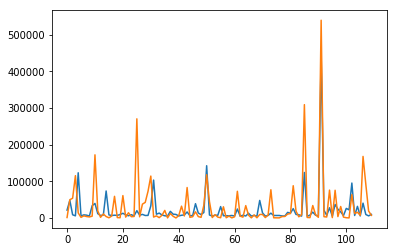

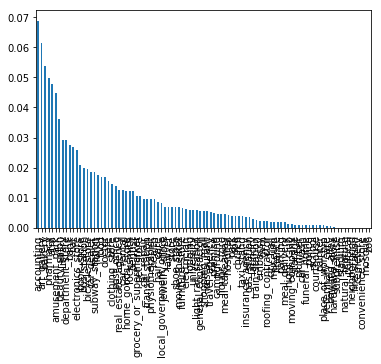

accounting           0.068848
art_gallery          0.061518
bakery               0.053665
pharmacy             0.049738
atm                  0.047644
amusement_park       0.044764
beauty_salon         0.036126
library              0.029058
department_store     0.029058
bank                 0.027487
bar                  0.026702
electronics_store    0.025916
book_store           0.020942
bus_station          0.019895
bicycle_store        0.019634
car_dealer           0.018586
subway_station       0.018586
florist              0.017539
food                 0.017016
doctor               0.016754
dtype: float32


In [151]:
clf_bow = train_printinfo(bow_types, targets.total[0])

lets try by total norm

Fitting 5 folds for each of 81 candidates, totalling 405 fits


[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:   14.5s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:   58.8s
[Parallel(n_jobs=2)]: Done 405 out of 405 | elapsed:  2.1min finished


Best estimator found by grid search:
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, eval_metric='mae', gamma=0,
       learning_rate=0.01, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=200, n_jobs=1,
       nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=1337, silent=True,
       subsample=0.7)
mae 45.3682328941
clf score -0.17498993794


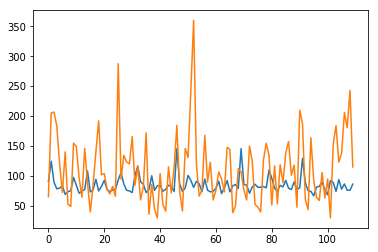

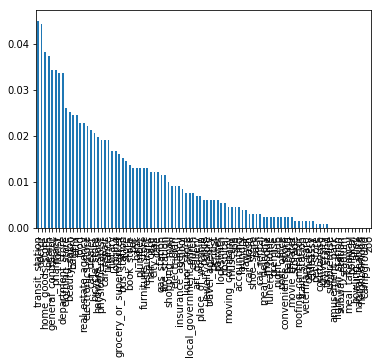

transit_station       0.045038
doctor                0.044275
home_goods_store      0.038168
health                0.037405
general_contractor    0.034351
pharmacy              0.034351
florist               0.033588
department_store      0.033588
clothing_store        0.025954
beauty_salon          0.025191
bakery                0.024427
atm                   0.024427
food                  0.022901
real_estate_agency    0.022901
electronics_store     0.022137
car_dealer            0.021374
bicycle_store         0.020611
hardware_store        0.019847
physiotherapist       0.019084
car_repair            0.019084
dtype: float32


In [152]:
clf_bownorm = train_printinfo(bow_types, targets.total_norm[1])

Lets see how the number of ameneties feature work

Fitting 5 folds for each of 81 candidates, totalling 405 fits


[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    7.6s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:   33.7s
[Parallel(n_jobs=2)]: Done 405 out of 405 | elapsed:  1.4min finished


Best estimator found by grid search:
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.6, eval_metric='mae', gamma=0,
       learning_rate=0.01, max_delta_step=0, max_depth=6,
       min_child_weight=1, missing=None, n_estimators=200, n_jobs=1,
       nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=1337, silent=True,
       subsample=0.6)
mae 25348.4462757
clf score 0.533022025727


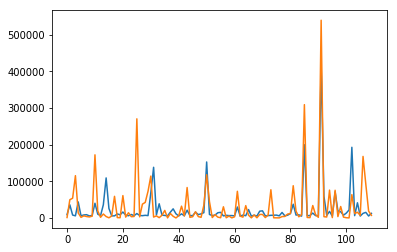

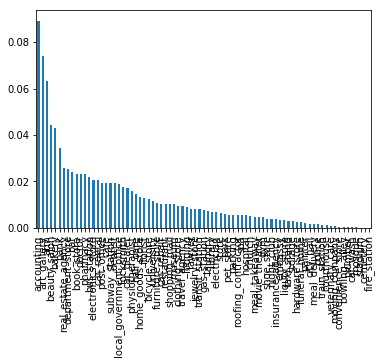

accounting                 0.089214
art_gallery                0.074035
atm                        0.063116
beauty_salon               0.044208
bakery                     0.043142
bank                       0.034354
real_estate_agency         0.025832
department_store           0.025300
bar                        0.023968
book_store                 0.023169
doctor                     0.023169
pharmacy                   0.023169
bus_station                0.021838
electronics_store          0.020772
car_rental                 0.020506
post_office                0.019441
cafe                       0.019441
subway_station             0.019174
dentist                    0.019174
local_government_office    0.018908
dtype: float32
Fitting 5 folds for each of 81 candidates, totalling 405 fits


[Parallel(n_jobs=2)]: Done  67 tasks      | elapsed:   12.8s
[Parallel(n_jobs=2)]: Done 217 tasks      | elapsed:   49.2s
[Parallel(n_jobs=2)]: Done 405 out of 405 | elapsed:  1.7min finished


Best estimator found by grid search:
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.7, eval_metric='mae', gamma=0,
       learning_rate=0.01, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=200, n_jobs=1,
       nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=1337, silent=True,
       subsample=0.7)
mae 45.7332299975
clf score -0.173357515638


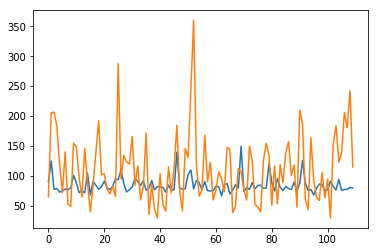

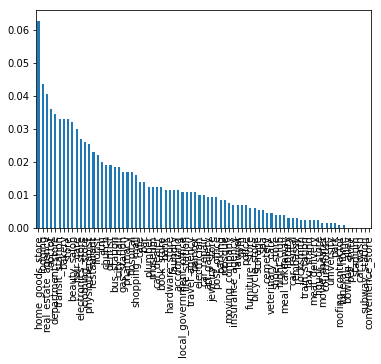

home_goods_store      0.062787
lodging               0.043645
real_estate_agency    0.040582
doctor                0.035988
department_store      0.034456
transit_station       0.032925
bakery                0.032925
store                 0.032925
beauty_salon          0.032159
hair_care             0.029862
electronics_store     0.026799
clothing_store        0.026034
physiotherapist       0.025268
restaurant            0.022971
florist               0.022205
atm                   0.019908
church                0.019142
dentist               0.019142
bus_station           0.018377
city_hall             0.018377
dtype: float32


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.7, eval_metric='mae', gamma=0,
       learning_rate=0.01, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=200, n_jobs=1,
       nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=1337, silent=True,
       subsample=0.7)

In [80]:
train_printinfo(number_ameneties, targets.total[0])
train_printinfo(number_ameneties, targets.total_norm[1])

conclu

Now lets try position feature

In [82]:
feature_lat_lon = pd.concat({'latitude': mean_lat, 'longitude': mean_lon}, 1)
feature_lat_lon.head()

,latitude,longitude
0,46.195629,6.193847
1,46.204399,6.200112
2,46.780945,6.636348
3,46.540162,6.621443
4,46.770865,6.650237


Fitting 5 folds for each of 81 candidates, totalling 405 fits


[Parallel(n_jobs=2)]: Done 256 tasks      | elapsed:    6.9s
[Parallel(n_jobs=2)]: Done 405 out of 405 | elapsed:   11.3s finished


Best estimator found by grid search:
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.6, eval_metric='mae', gamma=0,
       learning_rate=0.01, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=200, n_jobs=1,
       nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=1337, silent=True,
       subsample=0.6)
mae 19962.1475009
clf score 0.674500739499


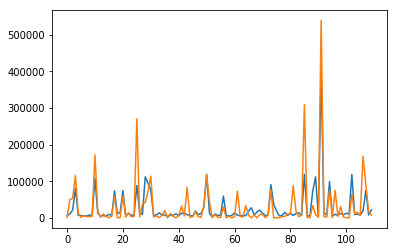

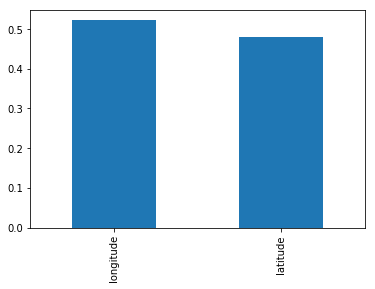

longitude    0.521395
latitude     0.478605
dtype: float32
Fitting 5 folds for each of 81 candidates, totalling 405 fits


[Parallel(n_jobs=2)]: Done 340 tasks      | elapsed:    7.3s
[Parallel(n_jobs=2)]: Done 405 out of 405 | elapsed:    8.9s finished


Best estimator found by grid search:
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.6, eval_metric='mae', gamma=0,
       learning_rate=0.01, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=200, n_jobs=1,
       nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=1337, silent=True,
       subsample=0.8)
mae 42.0427388978
clf score -0.0736968366727


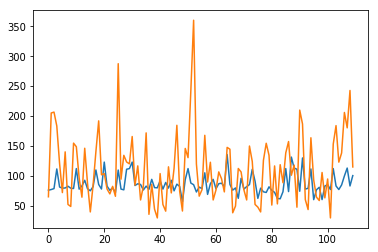

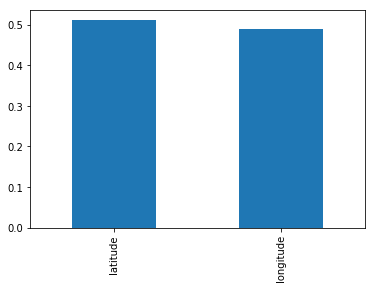

latitude     0.51087
longitude    0.48913
dtype: float32


In [84]:
clf_lat_lon_total = train_printinfo(feature_lat_lon, targets.total[0])
clf_lat_lon_totalnorm = train_printinfo(feature_lat_lon, targets.total_norm[1])

In [85]:
min_lat.min()
max_lat.max()
min_lon.min()
max_lon.max()

x = np.linspace(min_lat.min(), max_lat.max(), 1000)
y = np.linspace(min_lon.min(), max_lon.max(), 1000)

xx, yy = np.meshgrid(x,y)

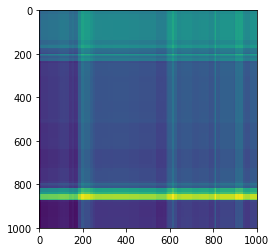

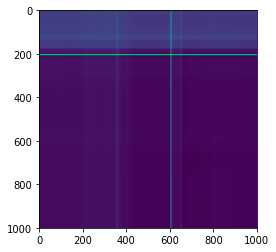

In [127]:
Z = clf_lat_lon_totalnorm.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.imshow(Z)
plt.show()

Z = clf_lat_lon_total.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.imshow(Z)
plt.show()

cant really see, lets do something a bit smarter

In [129]:
ll = np.stack([mean_lat, mean_lon], 1)
dd = np.stack([dlat, dlon], 1) * 5
gen_point = lambda: np.random.normal(loc=ll, scale=dd)
sampled = np.concatenate([gen_point() for i in range(4)])
sampled = pd.DataFrame(sampled).dropna().as_matrix()

In [130]:
plt_map(sampled[:,0], sampled[:,1], [1]*len(sampled), clf_lat_lon_total.predict(sampled))

In [131]:
plt_map(sampled[:,0], sampled[:,1], [1]*len(sampled), clf_lat_lon_totalnorm.predict(sampled))

In [132]:
# lets use lat, lon and types
feature_bow_lat_lon = pd.concat([bow_types, feature_lat_lon], 1)
feature_bow_lat_lon.head()

,accounting,amusement_park,art_gallery,atm,bakery,bank,bar,beauty_salon,bicycle_store,book_store,...,subway_station,taxi_stand,train_station,transit_station,travel_agency,university,veterinary_care,zoo,latitude,longitude
0,3,0,1,2,8,4,2,6,2,0,...,0,0,0,4,1,0,1,0,46.195629,6.193847
1,0,0,0,0,2,0,0,0,0,0,...,0,0,0,2,0,0,0,0,46.204399,6.200112
2,2,0,0,4,8,2,6,7,2,2,...,0,0,0,8,2,0,0,0,46.780945,6.636348
3,0,0,0,0,0,0,3,4,0,0,...,0,0,0,2,0,0,0,0,46.540162,6.621443
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,8,0,0,0,0,46.770865,6.650237


Fitting 5 folds for each of 81 candidates, totalling 405 fits


[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:   12.1s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:   48.1s
[Parallel(n_jobs=2)]: Done 405 out of 405 | elapsed:  2.0min finished


Best estimator found by grid search:
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.6, eval_metric='mae', gamma=0,
       learning_rate=0.01, max_delta_step=0, max_depth=6,
       min_child_weight=1, missing=None, n_estimators=200, n_jobs=1,
       nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=1337, silent=True,
       subsample=0.8)
mae 18435.1320113
clf score 0.74742403771


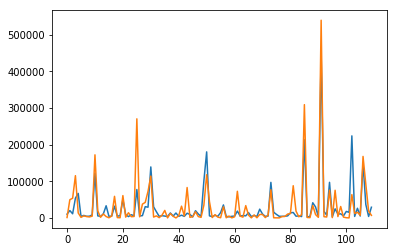

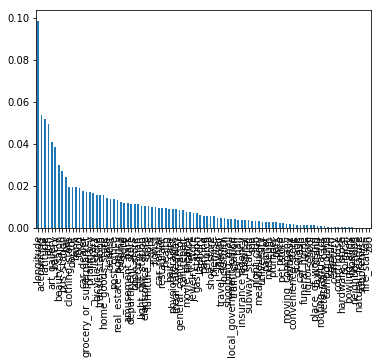

longitude                 0.098520
accounting                0.053738
latitude                  0.051791
atm                       0.049260
art_gallery               0.040693
bakery                    0.038551
beauty_salon              0.029790
bus_station               0.026869
bar                       0.023949
clothing_store            0.019470
doctor                    0.019470
bank                      0.019276
food                      0.018886
car_dealer                0.017718
grocery_or_supermarket    0.016939
pharmacy                  0.016939
library                   0.016355
bicycle_store             0.015576
transit_station           0.015576
home_goods_store          0.015382
dtype: float32
Fitting 5 folds for each of 81 candidates, totalling 405 fits


[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:   13.3s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:  1.0min
[Parallel(n_jobs=2)]: Done 405 out of 405 | elapsed:  2.2min finished


Best estimator found by grid search:
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.6, eval_metric='mae', gamma=0,
       learning_rate=0.01, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=200, n_jobs=1,
       nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=1337, silent=True,
       subsample=0.6)
mae 40.7945050568
clf score -0.0409179759374


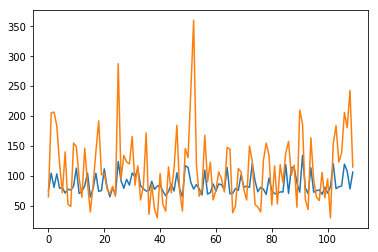

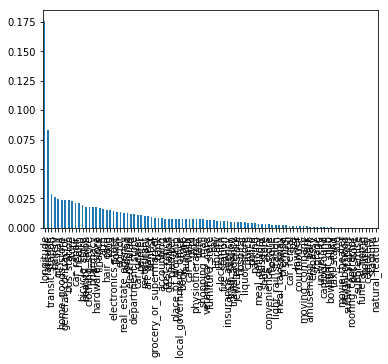

longitude             0.175962
latitude              0.083268
transit_station       0.029065
bakery                0.025923
city_hall             0.024352
home_goods_store      0.023566
general_contractor    0.023566
bus_station           0.023566
store                 0.022781
car_repair            0.021210
health                0.021210
bicycle_store         0.019639
beauty_salon          0.018068
clothing_store        0.018068
pharmacy              0.018068
hardware_store        0.017282
finance               0.016496
atm                   0.015711
hair_care             0.014925
food                  0.014925
dtype: float32


In [148]:
clf_best = train_printinfo(feature_bow_lat_lon, targets.total[0])
clf_bestnorm = train_printinfo(feature_bow_lat_lon, targets.total_norm[1])

we can see improvment

In [135]:
from sklearn import svm
# from sklearn.ensemble import RandomForestRegressor

tuned_parameters = [
                    {'kernel': ['rbf'], 'gamma': [14, 10, 8],
                     'C': [150, 200, 250]},
                    {'kernel': ['linear'], 'C': [5, 7, 10]}
                   ]
clf_svm = GridSearchCV(svm.SVR(), tuned_parameters, n_jobs=2, 
                   cv=KFold(n_splits=5, shuffle=True),
#                    scoring='accuracy',
                   verbose=1,
                   refit=True)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=2)]: Done  60 out of  60 | elapsed:  1.1min finished


Best estimator found by grid search:
SVR(C=150, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=8,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
mae 0.37923426789
clf score 0.488774683801


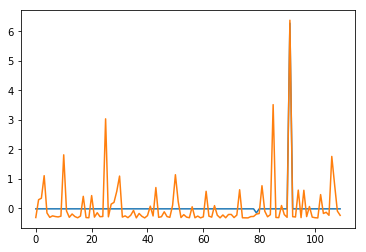

AttributeError: 'SVR' object has no attribute 'feature_importances_'

In [200]:
# this kind of model need to normalize the input to be able to train fast
# f = feature_bow_lat_lon.fillna(0)
# f = f - f.min()
# f = f / f.max()
# train_printinfo(f, targets.total_norm[1], clf=clf_svm)
feature_bow_lat_lon.longitude = feature_bow_lat_lon.longitude.fillna(feature_bow_lat_lon.longitude.mean())
feature_bow_lat_lon.latitude = feature_bow_lat_lon.latitude.fillna(feature_bow_lat_lon.latitude.mean())
f = feature_bow_lat_lon
f = f - f.mean()
f = f / f.std()
t = targets.total[0]
t = t - t.mean()
t = t / t.std()
t_norm = targets.total_norm[1]
t_norm = t_norm - t_norm.mean()
t_norm = t_norm / t_norm.std()
train_printinfo(f, t, clf=clf_svm)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=2)]: Done  60 out of  60 | elapsed:   44.2s finished


Best estimator found by grid search:
SVR(C=150, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=8,
  kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
mae 0.751884156695
clf score -0.023931991765


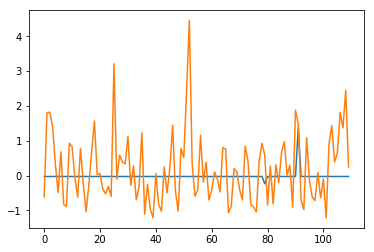

AttributeError: 'SVR' object has no attribute 'feature_importances_'

In [201]:
train_printinfo(f, t_norm, clf=clf_svm)

not very promising with svm
lets see what nn can do

In [202]:
from keras.models import Sequential
from keras.layers import Input, Dense, Dropout
from keras.wrappers.scikit_learn import KerasRegressor
from keras import regularizers

In [203]:
def base():
    model = Sequential()
    model.add(Dense(60, input_dim=f.shape[1], kernel_initializer='normal', activation='relu'))
    model.add(Dense(60, kernel_initializer='normal', activation='relu'))
    model.add(Dropout(0.25))
    model.add(Dense(60, kernel_initializer='normal', activation='relu'))
    model.add(Dense(1, kernel_initializer='normal'))
    model.compile(loss='mean_squared_error', optimizer='adam')
    return model

estimator = KerasRegressor(build_fn=base, nb_epoch=100, batch_size=15, verbose=0)

mae 0.371136709379
clf score 0.511707080697


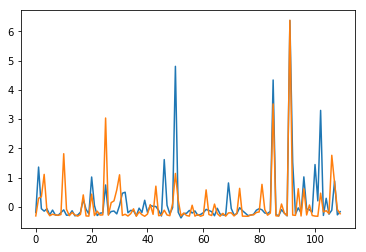

mae 0.898770286963
clf score 1.36591814052


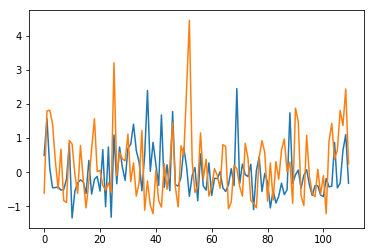

In [204]:
train_nogrid(f, t, clf=estimator)
train_nogrid(f, t_norm, clf=estimator)

Fitting 5 folds for each of 81 candidates, totalling 405 fits


[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    8.5s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:   40.4s
[Parallel(n_jobs=2)]: Done 405 out of 405 | elapsed:  1.7min finished


Best estimator found by grid search:
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.6, eval_metric='mae', gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=8, min_child_weight=1, missing=None,
       n_estimators=200, n_jobs=1, nthread=None, objective='reg:linear',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=1337, silent=True, subsample=0.7)
mae 0.300145491453
clf score 0.368847509302


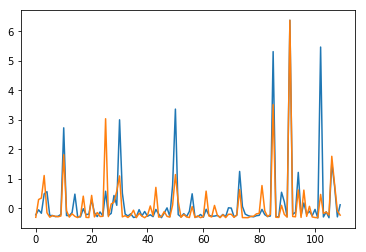

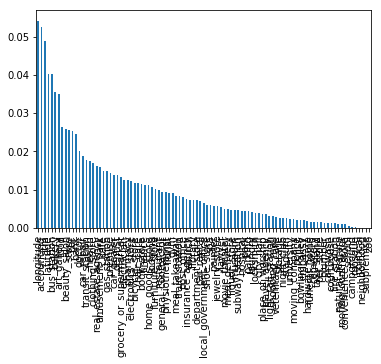

longitude             0.054133
accounting            0.052602
atm                   0.048845
latitude              0.040217
bus_station           0.040078
bakery                0.035486
art_gallery           0.035068
food                  0.026440
beauty_salon          0.025884
store                 0.025466
bar                   0.025188
bank                  0.024492
doctor                0.020178
car_repair            0.018647
transit_station       0.017673
health                0.017395
clothing_store        0.016838
real_estate_agency    0.016142
amusement_park        0.015864
cafe                  0.014890
dtype: float32
Fitting 5 folds for each of 81 candidates, totalling 405 fits


[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:   12.3s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:   47.1s
[Parallel(n_jobs=2)]: Done 405 out of 405 | elapsed:  1.8min finished


Best estimator found by grid search:
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.7, eval_metric='mae', gamma=0,
       learning_rate=0.01, max_delta_step=0, max_depth=3,
       min_child_weight=1, missing=None, n_estimators=200, n_jobs=1,
       nthread=None, objective='reg:linear', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=1337, silent=True,
       subsample=0.8)
mae 0.675472952199
clf score 0.128575647742


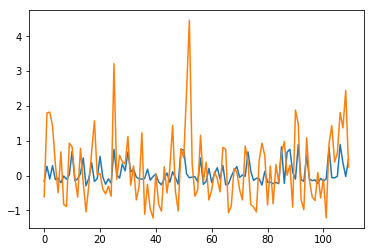

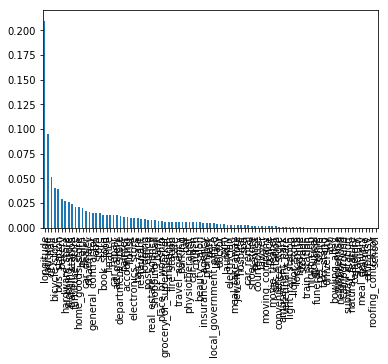

longitude             0.209906
latitude              0.095126
city_hall             0.051101
bicycle_store         0.040094
bus_station           0.039308
bakery                0.029088
hardware_store        0.026730
clothing_store        0.025943
transit_station       0.024371
furniture_store       0.021226
home_goods_store      0.021226
health                0.020440
car_dealer            0.017296
pharmacy              0.015723
general_contractor    0.014937
atm                   0.014937
store                 0.014937
book_store            0.013365
food                  0.012579
finance               0.012579
dtype: float32


In [205]:
clf_best = train_printinfo(f, t)
clf_bestnorm = train_printinfo(f, t_norm)

simple NN do much better, but not as well as xgboost

In [206]:
X_train = f.iloc[X_train_id].as_matrix()
y_train = t_norm.iloc[y_train_id].as_matrix()
X_test = f.iloc[X_test_id].as_matrix()
y_test = t_norm.iloc[y_test_id].as_matrix()

model = base()
model.fit(X_train, y_train, validation_data=(X_test, y_test), batch_size=10, epochs=1000)

Train on 436 samples, validate on 110 samples
Epoch 1/1000
436/436 [==============================] - 0s - loss: 0.9938 - val_loss: 1.0140
Epoch 2/1000
436/436 [==============================] - 0s - loss: 0.9757 - val_loss: 1.0087
Epoch 3/1000
436/436 [==============================] - 0s - loss: 0.8940 - val_loss: 1.0530
Epoch 4/1000
436/436 [==============================] - 0s - loss: 0.7828 - val_loss: 1.0820
Epoch 5/1000
436/436 [==============================] - 0s - loss: 0.7028 - val_loss: 1.1408
Epoch 6/1000
436/436 [==============================] - 0s - loss: 0.6208 - val_loss: 1.2021
Epoch 7/1000
436/436 [==============================] - 0s - loss: 0.5575 - val_loss: 1.1977
Epoch 8/1000
436/436 [==============================] - 0s - loss: 0.4716 - val_loss: 1.2935
Epoch 9/1000
436/436 [==============================] - 0s - loss: 0.4160 - val_loss: 1.2814
Epoch 10/1000
436/436 [==============================] - 0s - loss: 0.3832 - val_loss: 1.2909
Epoch 11/1000
436/436 [

436/436 [==============================] - 0s - loss: 0.0517 - val_loss: 1.2107
Epoch 88/1000
436/436 [==============================] - 0s - loss: 0.0745 - val_loss: 1.2208
Epoch 89/1000
436/436 [==============================] - 0s - loss: 0.0624 - val_loss: 1.3201
Epoch 90/1000
436/436 [==============================] - 0s - loss: 0.0562 - val_loss: 1.3101
Epoch 91/1000
436/436 [==============================] - 0s - loss: 0.0493 - val_loss: 1.3547
Epoch 92/1000
436/436 [==============================] - 0s - loss: 0.0519 - val_loss: 1.2855
Epoch 93/1000
436/436 [==============================] - 0s - loss: 0.0533 - val_loss: 1.2394
Epoch 94/1000
436/436 [==============================] - 0s - loss: 0.0496 - val_loss: 1.3135
Epoch 95/1000
436/436 [==============================] - 0s - loss: 0.0408 - val_loss: 1.3263
Epoch 96/1000
436/436 [==============================] - 0s - loss: 0.0450 - val_loss: 1.3310
Epoch 97/1000
436/436 [==============================] - 0s - loss: 0.0456

436/436 [==============================] - 0s - loss: 0.0266 - val_loss: 1.2747
Epoch 174/1000
436/436 [==============================] - 0s - loss: 0.0298 - val_loss: 1.2507
Epoch 175/1000
436/436 [==============================] - 0s - loss: 0.0308 - val_loss: 1.2700
Epoch 176/1000
436/436 [==============================] - 0s - loss: 0.0350 - val_loss: 1.3060
Epoch 177/1000
436/436 [==============================] - 0s - loss: 0.0297 - val_loss: 1.2355
Epoch 178/1000
436/436 [==============================] - 0s - loss: 0.0315 - val_loss: 1.2952
Epoch 179/1000
436/436 [==============================] - 0s - loss: 0.0363 - val_loss: 1.2327
Epoch 180/1000
436/436 [==============================] - 0s - loss: 0.0499 - val_loss: 1.2849
Epoch 181/1000
436/436 [==============================] - 0s - loss: 0.0279 - val_loss: 1.3227
Epoch 182/1000
436/436 [==============================] - 0s - loss: 0.0367 - val_loss: 1.2755
Epoch 183/1000
436/436 [==============================] - 0s - lo

436/436 [==============================] - 0s - loss: 0.0193 - val_loss: 1.2315
Epoch 260/1000
436/436 [==============================] - 0s - loss: 0.0232 - val_loss: 1.2198
Epoch 261/1000
436/436 [==============================] - 0s - loss: 0.0236 - val_loss: 1.2766
Epoch 262/1000
436/436 [==============================] - 0s - loss: 0.0284 - val_loss: 1.2736
Epoch 263/1000
436/436 [==============================] - 0s - loss: 0.0261 - val_loss: 1.2983
Epoch 264/1000
436/436 [==============================] - 0s - loss: 0.0288 - val_loss: 1.3441
Epoch 265/1000
436/436 [==============================] - 0s - loss: 0.0204 - val_loss: 1.2769
Epoch 266/1000
436/436 [==============================] - 0s - loss: 0.0219 - val_loss: 1.2472
Epoch 267/1000
436/436 [==============================] - 0s - loss: 0.0263 - val_loss: 1.3021
Epoch 268/1000
436/436 [==============================] - 0s - loss: 0.0245 - val_loss: 1.2974
Epoch 269/1000
436/436 [==============================] - 0s - lo

436/436 [==============================] - 0s - loss: 0.0179 - val_loss: 1.2613
Epoch 346/1000
436/436 [==============================] - 0s - loss: 0.0163 - val_loss: 1.2175
Epoch 347/1000
436/436 [==============================] - 0s - loss: 0.0175 - val_loss: 1.1922
Epoch 348/1000
436/436 [==============================] - 0s - loss: 0.0274 - val_loss: 1.2483
Epoch 349/1000
436/436 [==============================] - 0s - loss: 0.0258 - val_loss: 1.1802
Epoch 350/1000
436/436 [==============================] - 0s - loss: 0.0214 - val_loss: 1.2619
Epoch 351/1000
436/436 [==============================] - 0s - loss: 0.0252 - val_loss: 1.2444
Epoch 352/1000
436/436 [==============================] - 0s - loss: 0.0220 - val_loss: 1.1938
Epoch 353/1000
436/436 [==============================] - 0s - loss: 0.0202 - val_loss: 1.2622
Epoch 354/1000
436/436 [==============================] - 0s - loss: 0.0188 - val_loss: 1.2596
Epoch 355/1000
436/436 [==============================] - 0s - lo

436/436 [==============================] - 0s - loss: 0.0172 - val_loss: 1.2616
Epoch 432/1000
436/436 [==============================] - 0s - loss: 0.0181 - val_loss: 1.2221
Epoch 433/1000
436/436 [==============================] - 0s - loss: 0.0201 - val_loss: 1.2946
Epoch 434/1000
436/436 [==============================] - 0s - loss: 0.0173 - val_loss: 1.2494
Epoch 435/1000
436/436 [==============================] - 0s - loss: 0.0185 - val_loss: 1.2538
Epoch 436/1000
436/436 [==============================] - 0s - loss: 0.0168 - val_loss: 1.2700
Epoch 437/1000
436/436 [==============================] - 0s - loss: 0.0271 - val_loss: 1.2473
Epoch 438/1000
436/436 [==============================] - 0s - loss: 0.0201 - val_loss: 1.2674
Epoch 439/1000
436/436 [==============================] - 0s - loss: 0.0195 - val_loss: 1.2729
Epoch 440/1000
436/436 [==============================] - 0s - loss: 0.0200 - val_loss: 1.3089
Epoch 441/1000
436/436 [==============================] - 0s - lo

436/436 [==============================] - 0s - loss: 0.0158 - val_loss: 1.3032
Epoch 518/1000
436/436 [==============================] - 0s - loss: 0.0150 - val_loss: 1.2586
Epoch 519/1000
436/436 [==============================] - 0s - loss: 0.0139 - val_loss: 1.2758
Epoch 520/1000
436/436 [==============================] - 0s - loss: 0.0141 - val_loss: 1.3090
Epoch 521/1000
436/436 [==============================] - 0s - loss: 0.0120 - val_loss: 1.2769
Epoch 522/1000
436/436 [==============================] - 0s - loss: 0.0199 - val_loss: 1.2831
Epoch 523/1000
436/436 [==============================] - 0s - loss: 0.0152 - val_loss: 1.2940
Epoch 524/1000
436/436 [==============================] - 0s - loss: 0.0138 - val_loss: 1.2721
Epoch 525/1000
436/436 [==============================] - 0s - loss: 0.0197 - val_loss: 1.3022
Epoch 526/1000
436/436 [==============================] - 0s - loss: 0.0185 - val_loss: 1.2640
Epoch 527/1000
436/436 [==============================] - 0s - lo

436/436 [==============================] - 0s - loss: 0.0167 - val_loss: 1.2426
Epoch 604/1000
436/436 [==============================] - 0s - loss: 0.0154 - val_loss: 1.2328
Epoch 605/1000
436/436 [==============================] - 0s - loss: 0.0136 - val_loss: 1.3097
Epoch 606/1000
436/436 [==============================] - 0s - loss: 0.0182 - val_loss: 1.2948ss: 0.020
Epoch 607/1000
436/436 [==============================] - 0s - loss: 0.0179 - val_loss: 1.3168ss: 0.019
Epoch 608/1000
436/436 [==============================] - 0s - loss: 0.0287 - val_loss: 1.2712
Epoch 609/1000
436/436 [==============================] - 0s - loss: 0.0335 - val_loss: 1.2696
Epoch 610/1000
436/436 [==============================] - 0s - loss: 0.0255 - val_loss: 1.2586ss: 0.02
Epoch 611/1000
436/436 [==============================] - 0s - loss: 0.0195 - val_loss: 1.3066
Epoch 612/1000
436/436 [==============================] - 0s - loss: 0.0280 - val_loss: 1.2890
Epoch 613/1000
436/436 [===============

436/436 [==============================] - 0s - loss: 0.0181 - val_loss: 1.3470
Epoch 690/1000
436/436 [==============================] - 0s - loss: 0.0190 - val_loss: 1.2830
Epoch 691/1000
436/436 [==============================] - 0s - loss: 0.0154 - val_loss: 1.3353
Epoch 692/1000
436/436 [==============================] - 0s - loss: 0.0154 - val_loss: 1.2930
Epoch 693/1000
436/436 [==============================] - 0s - loss: 0.0147 - val_loss: 1.2923
Epoch 694/1000
436/436 [==============================] - 0s - loss: 0.0127 - val_loss: 1.2892
Epoch 695/1000
436/436 [==============================] - 0s - loss: 0.0131 - val_loss: 1.2911
Epoch 696/1000
436/436 [==============================] - 0s - loss: 0.0174 - val_loss: 1.4046
Epoch 697/1000
436/436 [==============================] - 0s - loss: 0.0225 - val_loss: 1.3237
Epoch 698/1000
436/436 [==============================] - 0s - loss: 0.0340 - val_loss: 1.4255
Epoch 699/1000
436/436 [==============================] - 0s - lo

436/436 [==============================] - 0s - loss: 0.0175 - val_loss: 1.3015
Epoch 776/1000
436/436 [==============================] - 0s - loss: 0.0169 - val_loss: 1.3302
Epoch 777/1000
436/436 [==============================] - 0s - loss: 0.0188 - val_loss: 1.3031
Epoch 778/1000
436/436 [==============================] - 0s - loss: 0.0140 - val_loss: 1.2732
Epoch 779/1000
436/436 [==============================] - 0s - loss: 0.0174 - val_loss: 1.3161
Epoch 780/1000
436/436 [==============================] - 0s - loss: 0.0130 - val_loss: 1.2497
Epoch 781/1000
436/436 [==============================] - 0s - loss: 0.0136 - val_loss: 1.2893
Epoch 782/1000
436/436 [==============================] - 0s - loss: 0.0173 - val_loss: 1.3285
Epoch 783/1000
436/436 [==============================] - 0s - loss: 0.0167 - val_loss: 1.2612ss: 0.02
Epoch 784/1000
436/436 [==============================] - 0s - loss: 0.0180 - val_loss: 1.2895
Epoch 785/1000
436/436 [==============================] -

436/436 [==============================] - 0s - loss: 0.0138 - val_loss: 1.3142
Epoch 861/1000
436/436 [==============================] - 0s - loss: 0.0134 - val_loss: 1.3082
Epoch 862/1000
436/436 [==============================] - 0s - loss: 0.0134 - val_loss: 1.3195
Epoch 863/1000
436/436 [==============================] - 0s - loss: 0.0165 - val_loss: 1.3086
Epoch 864/1000
436/436 [==============================] - 0s - loss: 0.0128 - val_loss: 1.2948
Epoch 865/1000
436/436 [==============================] - 0s - loss: 0.0134 - val_loss: 1.2655
Epoch 866/1000
436/436 [==============================] - 0s - loss: 0.0157 - val_loss: 1.2841
Epoch 867/1000
436/436 [==============================] - 0s - loss: 0.0145 - val_loss: 1.3215
Epoch 868/1000
436/436 [==============================] - 0s - loss: 0.0131 - val_loss: 1.3338
Epoch 869/1000
436/436 [==============================] - 0s - loss: 0.0175 - val_loss: 1.2540
Epoch 870/1000
436/436 [==============================] - 0s - lo

436/436 [==============================] - 0s - loss: 0.0139 - val_loss: 1.3823
Epoch 947/1000
436/436 [==============================] - 0s - loss: 0.0133 - val_loss: 1.3392
Epoch 948/1000
436/436 [==============================] - 0s - loss: 0.0136 - val_loss: 1.3560
Epoch 949/1000
436/436 [==============================] - 0s - loss: 0.0183 - val_loss: 1.3221
Epoch 950/1000
436/436 [==============================] - 0s - loss: 0.0154 - val_loss: 1.3566
Epoch 951/1000
436/436 [==============================] - 0s - loss: 0.0126 - val_loss: 1.3830
Epoch 952/1000
436/436 [==============================] - 0s - loss: 0.0154 - val_loss: 1.3240
Epoch 953/1000
436/436 [==============================] - 0s - loss: 0.0190 - val_loss: 1.3005
Epoch 954/1000
436/436 [==============================] - 0s - loss: 0.0154 - val_loss: 1.3225
Epoch 955/1000
436/436 [==============================] - 0s - loss: 0.0155 - val_loss: 1.3127
Epoch 956/1000
436/436 [==============================] - 0s - lo

0.962975571778


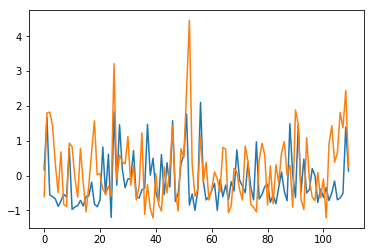

In [207]:
print(np.mean(np.abs(model.predict(X_test) - y_test)))

plt.plot(model.predict(X_test))
plt.plot(y_test)

As it is in most case with small dataset boosting algo perform way better, lets stop here for testing models

Fitting 5 folds for each of 81 candidates, totalling 405 fits


[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    9.1s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:   46.6s
[Parallel(n_jobs=2)]: Done 405 out of 405 | elapsed:  2.1min finished


Best estimator found by grid search:
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.6, eval_metric='mae', gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=None,
       n_estimators=200, n_jobs=1, nthread=None, objective='reg:linear',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=1337, silent=True, subsample=0.6)
mae 43.4382786766
clf score -0.0827047472865


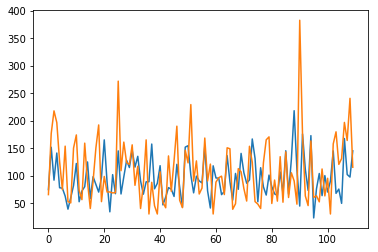

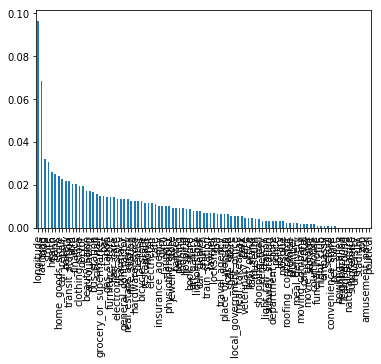

longitude                 0.096622
latitude                  0.068342
food                      0.032207
store                     0.030636
health                    0.025923
bank                      0.025137
home_goods_store          0.024352
car_repair                0.022781
bakery                    0.021995
transit_station           0.021995
atm                       0.020424
finance                   0.020424
clothing_store            0.019639
doctor                    0.019639
beauty_salon              0.017282
accounting                0.017282
bus_station               0.016496
city_hall                 0.015711
grocery_or_supermarket    0.014925
bar                       0.014925
dtype: float32


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.6, eval_metric='mae', gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=3, min_child_weight=1, missing=None,
       n_estimators=200, n_jobs=1, nthread=None, objective='reg:linear',
       random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=1337, silent=True, subsample=0.6)

In [146]:
train_printinfo(feature_bow_lat_lon, targets.total_year_norm[2017])

cluster area

In [ ]:
# from sklearn.cluster import KMeans, DBSCAN
# from sklearn import mixture

In [ ]:
# db = DBSCAN(eps=0.04, min_samples=4)
# db = KMeans(n_clusters=25)
# db = mixture.GaussianMixture(n_components=40)

In [ ]:
# c = db.fit(np.stack([mean_lat.dropna(), mean_lon.dropna()], 1))
# pred = c.predict(np.stack([mean_lat.dropna(), mean_lon.dropna()], 1))
# pred = c.labels_

In [ ]:
# plt.scatter(mean_lat.dropna(), mean_lon.dropna(), c=pred)

In [ ]:
# plt_map(mean_lat.dropna(), mean_lon.dropna(), [0.001]*len(pred), [0.001]*len(pred), pred)

lets see what in our best model permit to improve the sales

In [217]:
d = pd.DataFrame()
for i, key in enumerate(bow_types.columns):
#     print(key)
    feature = bow_types[key]
    x = np.linspace(feature.min(), feature.max(), 10)
    x_to = np.zeros([10, bow_types.shape[1]])
    x_to[:, i] = x
    d[key] = clf_bow.predict(x_to)
#     plt.plot(clf_bow.predict(x_to))
#     plt.show()

# d.iloc[0].max()
d.max().sort_values()[::-1]

amusement_park             170788.718750
department_store           108822.554688
subway_station              71306.429688
pharmacy                    58649.328125
library                     55138.332031
car_rental                  47760.035156
post_office                 46016.429688
university                  44228.773438
real_estate_agency          36524.214844
bicycle_store               24771.017578
lawyer                      17835.767578
travel_agency               16854.531250
bakery                      16025.885742
health                      15545.400391
dentist                     14833.218750
transit_station             13612.257812
locksmith                   13356.907227
physiotherapist             12625.017578
cafe                        12235.115234
bus_station                 11434.163086
car_dealer                  10568.208984
furniture_store             10464.416992
spa                         10330.274414
movie_theater                9728.623047
bar             

In [178]:
d = pd.DataFrame()
for i, key in enumerate(bow_types.columns):
#     print(key)
    feature = bow_types[key]
    x = np.linspace(feature.min(), feature.max(), 10)
    x_to = np.zeros([10, bow_types.shape[1]])
    x_to[:, i] = x
    d[key] = clf_bownorm.predict(x_to)
#     plt.show()
d.max().sort_values()[::-1]

pharmacy                   92.065437
department_store           89.490494
home_goods_store           86.782043
city_hall                  86.605423
clothing_store             84.618919
library                    81.961525
shopping_mall              81.354568
bakery                     80.384880
local_government_office    79.794792
finance                    79.089218
store                      78.971947
fire_station               78.086243
car_dealer                 77.985596
doctor                     77.946419
grocery_or_supermarket     77.917183
car_rental                 77.765335
health                     77.623619
hardware_store             77.609764
furniture_store            77.325478
transit_station            76.773521
florist                    76.440712
gym                        76.421333
church                     76.313591
parking                    76.170723
post_office                75.993721
painter                    75.955650
bicycle_store              75.827446
b